In [ ]:
%pip install numpy==1.26.4


In [ ]:
%pip install photutils==1.9.0

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from photutils.detection import DAOStarFinder
from photutils.aperture import CircularAperture, CircularAnnulus, aperture_photometry

In [ ]:
from google.colab import files
files.upload()

Saving hwp_0_set3.FIT to hwp_0_set3 (1).FIT
Saving hwp_22-5_set3.FIT to hwp_22-5_set3 (1).FIT
Saving hwp_45_set3.FIT to hwp_45_set3 (1).FIT
Saving hwp_67-5_set3.FIT to hwp_67-5_set3 (1).FIT


{'hwp_0_set3 (1).FIT': b'SIMPLE  =                    T /                                                BITPIX  =                   16 /                                                NAXIS   =                    2 /                                                NAXIS1  =                  512 /                                                NAXIS2  =                  512 /                                                OBJECT  = \'        \'           /                                                TELESCOP= \'Unknown Telescope\'                                                   INSTRUME= \'SBIG ST-9\'                                                           OBSERVER= \'Observer\'s Name\'                                                     DATE-OBS= \'2026-02-10T10:51:19.000\' / GMT START OF EXPOSURE [WIN]               BZERO   = +3.276800000000E+004 /                                                BSCALE  = +1.000000000000E+000 /                                                EXPT

In [ ]:
data = {
    '0':  'hwp_0_set3.FIT',
    '22.5':  'hwp_22-5_set3.FIT',
    '45': 'hwp_45_set3.FIT',
    '67.5': 'hwp_67-5_set3.FIT'}

In [ ]:
images = {k: fits.getdata(v, ignore_missing_simple=True) for k, v in data.items()}

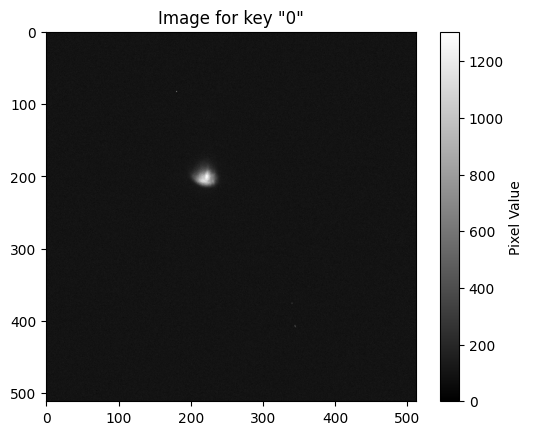

In [ ]:
plt.imshow(images['0'], cmap='gray')


plt.title('Image for key "0"')
plt.colorbar(label='Pixel Value')
plt.show()

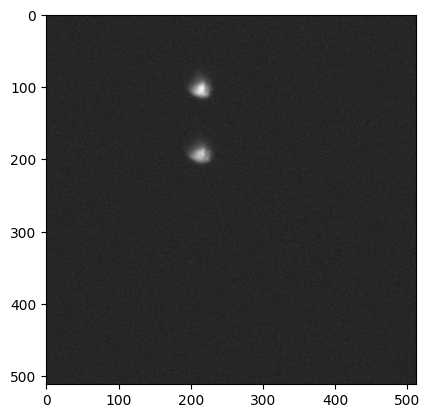

In [ ]:
plt.imshow(images['67.5'], cmap='gray')
plt.show()

center x, y =  [219.36791892] [204.76870289]


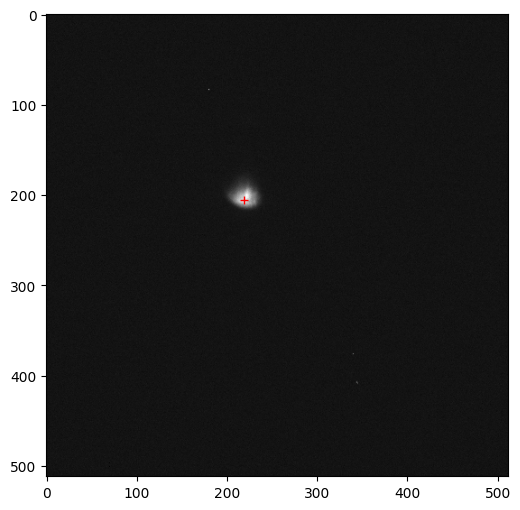

In [ ]:
x0, y0 = 200, 200 # rough guess for central coordinates of a star
cutout = 31 # subimage or cutout around x0, y0.

from photutils.centroids import centroid_2dg, centroid_sources

# centroid_2g will fit 2d gausssian arund x0,y0 to find exact cenetr

x, y = centroid_sources(images['0'], x0, y0, box_size=cutout, centroid_func=centroid_2dg)

print('center x, y = ',x,y)

plt.figure(figsize=(6,6))
plt.imshow(images['0'], cmap='gray')
plt.plot(x,y, 'r+')
plt.show()

In [ ]:
image = images['0']

In [ ]:
cutout_size = cutout # Already defined as 31 from previous step
half_cutout = int(cutout_size / 2)

x_center = int(x)
y_center = int(y)

# Calculate min and max coordinates for the cutout, ensuring they stay within image bounds
x_min = max(0, x_center - half_cutout)
x_max = min(image.shape[1], x_center + half_cutout + 1) # +1 because slicing is exclusive
y_min = max(0, y_center - half_cutout)
y_max = min(image.shape[0], y_center + half_cutout + 1) # +1 because slicing is exclusive

star_cutout = image[y_min:y_max, x_min:x_max]

print(f"Star cutout shape: {star_cutout.shape}")
print(f"Cutout x_min: {x_min}, x_max: {x_max}, y_min: {y_min}, y_max: {y_max}")


Star cutout shape: (31, 31)
Cutout x_min: 204, x_max: 235, y_min: 189, y_max: 220


/tmp/ipython-input-2146860284.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x_center = int(x)
/tmp/ipython-input-2146860284.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_center = int(y)


In [ ]:
ny, nx = star_cutout.shape # Get dimensions of the star_cutout

x_indices = np.arange(nx) # Create 1D array for x-coordinates
y_indices = np.arange(ny) # Create 1D array for y-coordinates

x_mesh, y_mesh = np.meshgrid(x_indices, y_indices) # Create 2D coordinate grids

x_data = x_mesh.ravel() # Flatten x_mesh into 1D array
y_data = y_mesh.ravel() # Flatten y_mesh into 1D array
z_data = star_cutout.ravel() # Flatten star_cutout into 1D array

print(f"Shape of x_mesh: {x_mesh.shape}")
print(f"Shape of y_mesh: {y_mesh.shape}")
print(f"Shape of z_data (flattened cutout): {z_data.shape}")

Shape of x_mesh: (31, 31)
Shape of y_mesh: (31, 31)
Shape of z_data (flattened cutout): (961,)


In [ ]:
from astropy.modeling.models import Gaussian2D
from astropy.modeling.fitting import LevMarLSQFitter

# Initial guesses for Gaussian parameters
amplitude_guess = np.max(star_cutout) # Use the maximum pixel value as initial amplitude
x_mean_guess = nx / 2.0 # Center of the cutout in x
y_mean_guess = ny / 2.0 # Center of the cutout in y
x_stddev_guess = 2.0 # Initial guess for standard deviation in x
y_stddev_guess = 2.0 # Initial guess for standard deviation in y

# Define the 2D Gaussian model with initial guesses
g_init = Gaussian2D(amplitude=amplitude_guess, x_mean=x_mean_guess, y_mean=y_mean_guess,
                     x_stddev=x_stddev_guess, y_stddev=y_stddev_guess)

print(f"Initial Gaussian parameters: ")
print(f"  Amplitude: {g_init.amplitude.value}")
print(f"  x_mean: {g_init.x_mean.value}")
print(f"  y_mean: {g_init.y_mean.value}")
print(f"  x_stddev: {g_init.x_stddev.value}")
print(f"  y_stddev: {g_init.y_stddev.value}")

Initial Gaussian parameters: 
  Amplitude: 1304.0
  x_mean: 15.5
  y_mean: 15.5
  x_stddev: 2.0
  y_stddev: 2.0


In [ ]:
fitter = LevMarLSQFitter() # Initialize the fitter
g_fit = fitter(g_init, x_data, y_data, z_data) # Fit the model to the data

print(f"Fitted Gaussian parameters:")
print(f"  Amplitude: {g_fit.amplitude.value:.2f}")
print(f"  x_mean: {g_fit.x_mean.value:.2f}")
print(f"  y_mean: {g_fit.y_mean.value:.2f}")
print(f"  x_stddev: {g_fit.x_stddev.value:.2f}")
print(f"  y_stddev: {g_fit.y_stddev.value:.2f}")

Fitted Gaussian parameters:
  Amplitude: 1190.12
  x_mean: 16.23
  y_mean: 13.81
  x_stddev: 9.97
  y_stddev: 8.12


In [ ]:
fwhm_x = 2 * np.sqrt(2 * np.log(2)) * g_fit.x_stddev.value
fwhm_y = 2 * np.sqrt(2 * np.log(2)) * g_fit.y_stddev.value

print(f"FWHM in x-direction: {fwhm_x:.2f}")
print(f"FWHM in y-direction: {fwhm_y:.2f}")

FWHM in x-direction: 23.47
FWHM in y-direction: 19.12


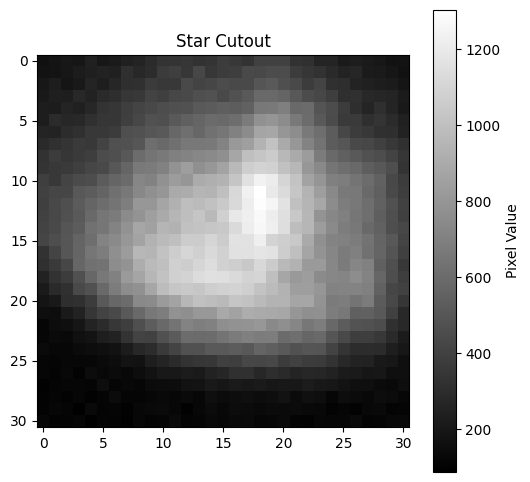

In [ ]:
plt.figure(figsize=(6,6))
plt.imshow(star_cutout, cmap='gray')
plt.title('Star Cutout')
plt.colorbar(label='Pixel Value')
plt.show()

In [ ]:
fwhm_avg = np.mean([fwhm_x, fwhm_y])

print(f"Average FWHM: {fwhm_avg:.2f}")

Average FWHM: 21.29


In [ ]:
aperture_radius = 1.5 * fwhm_avg
print(f"Aperture radius: {aperture_radius:.2f}")

Aperture radius: 31.94


In [ ]:
fitted_x_image = x_min + g_fit.x_mean.value
fitted_y_image = y_min + g_fit.y_mean.value

positions = [(fitted_x_image, fitted_y_image)]

# Define background annulus radii
inner_annulus_radius = 2.0 * aperture_radius
outer_annulus_radius = 3.0 * aperture_radius

# Create aperture and annulus objects
aperture = CircularAperture(positions, r=aperture_radius)
annulus_aperture = CircularAnnulus(positions, r_in=inner_annulus_radius, r_out=outer_annulus_radius)

print(f"Fitted star center in original image: x={fitted_x_image:.2f}, y={fitted_y_image:.2f}")
print(f"Aperture radius: {aperture_radius:.2f}")
print(f"Inner annulus radius: {inner_annulus_radius:.2f}")
print(f"Outer annulus radius: {outer_annulus_radius:.2f}")

Fitted star center in original image: x=220.23, y=202.81
Aperture radius: 31.94
Inner annulus radius: 63.87
Outer annulus radius: 95.81


In [ ]:
phot_table = aperture_photometry(image, aperture)
annulus_phot_table = aperture_photometry(image, annulus_aperture)

# Calculate mean background in the annulus
b_mean = annulus_phot_table['aperture_sum'] / annulus_aperture.area

# Calculate total background in the aperture
b_sum = b_mean * aperture.area

# Calculate background-subtracted flux
final_flux0 = phot_table['aperture_sum'] - b_sum

print(f"Raw aperture flux: {phot_table['aperture_sum'][0]:.2f}")
print(f"Mean background per pixel: {b_mean[0]:.2f}")
print(f"Total background in aperture: {b_sum[0]:.2f}")
print(f"Background-subtracted flux: {final_flux0[0]:.2f}")

Raw aperture flux: 798983.50
Mean background per pixel: 101.90
Total background in aperture: 326517.92
Background-subtracted flux: 472465.58


Code 2

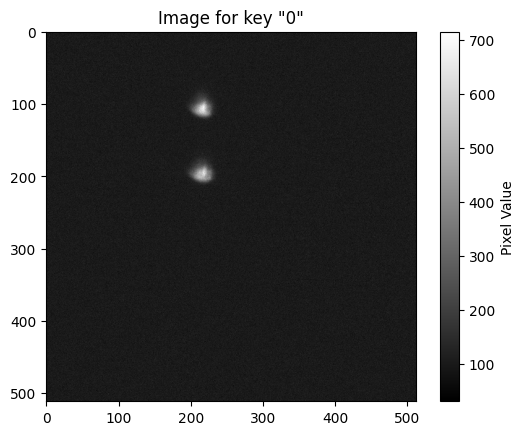

In [ ]:
plt.imshow(images['22.5'], cmap='gray')


plt.title('Image for key "0"')
plt.colorbar(label='Pixel Value')
plt.show()

center x, y =  [216.01973548] [107.9356781]


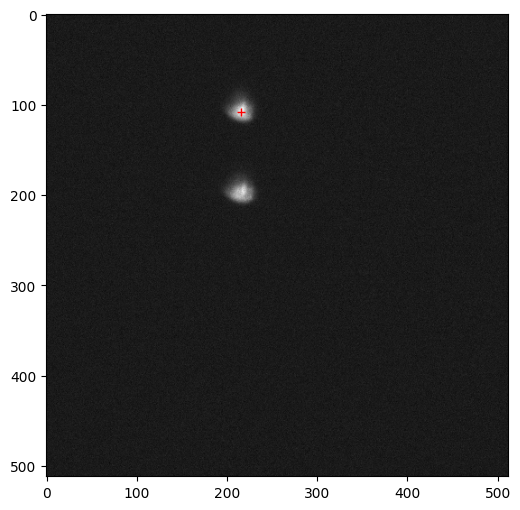

In [ ]:
x0, y0 = 210, 100 # rough guess for central coordinates of a star
cutout = 31 # subimage or cutout around x0, y0.

from photutils.centroids import centroid_2dg, centroid_sources

# centroid_2g will fit 2d gausssian arund x0,y0 to find exact cenetr

x, y = centroid_sources(images['22.5'], x0, y0, box_size=cutout, centroid_func=centroid_2dg)

print('center x, y = ',x,y)

plt.figure(figsize=(6,6))
plt.imshow(images['22.5'], cmap='gray')
plt.plot(x,y, 'r+')
plt.show()

In [ ]:
image = images['22.5']

In [ ]:
cutout_size = cutout # Already defined as 31 from previous step
half_cutout = int(cutout_size / 2)

x_center = int(x)
y_center = int(y)

# Calculate min and max coordinates for the cutout, ensuring they stay within image bounds
x_min = max(0, x_center - half_cutout)
x_max = min(image.shape[1], x_center + half_cutout + 1) # +1 because slicing is exclusive
y_min = max(0, y_center - half_cutout)
y_max = min(image.shape[0], y_center + half_cutout + 1) # +1 because slicing is exclusive

star_cutout = image[y_min:y_max, x_min:x_max]

print(f"Star cutout shape: {star_cutout.shape}")
print(f"Cutout x_min: {x_min}, x_max: {x_max}, y_min: {y_min}, y_max: {y_max}")


Star cutout shape: (31, 31)
Cutout x_min: 201, x_max: 232, y_min: 92, y_max: 123


/tmp/ipython-input-2146860284.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x_center = int(x)
/tmp/ipython-input-2146860284.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_center = int(y)


In [ ]:
ny, nx = star_cutout.shape # Get dimensions of the star_cutout

x_indices = np.arange(nx) # Create 1D array for x-coordinates
y_indices = np.arange(ny) # Create 1D array for y-coordinates

x_mesh, y_mesh = np.meshgrid(x_indices, y_indices) # Create 2D coordinate grids

x_data = x_mesh.ravel() # Flatten x_mesh into 1D array
y_data = y_mesh.ravel() # Flatten y_mesh into 1D array
z_data = star_cutout.ravel() # Flatten star_cutout into 1D array

print(f"Shape of x_mesh: {x_mesh.shape}")
print(f"Shape of y_mesh: {y_mesh.shape}")
print(f"Shape of z_data (flattened cutout): {z_data.shape}")

Shape of x_mesh: (31, 31)
Shape of y_mesh: (31, 31)
Shape of z_data (flattened cutout): (961,)


In [ ]:
from astropy.modeling.models import Gaussian2D
from astropy.modeling.fitting import LevMarLSQFitter

# Initial guesses for Gaussian parameters
amplitude_guess = np.max(star_cutout) # Use the maximum pixel value as initial amplitude
x_mean_guess = nx / 2.0 # Center of the cutout in x
y_mean_guess = ny / 2.0 # Center of the cutout in y
x_stddev_guess = 2.0 # Initial guess for standard deviation in x
y_stddev_guess = 2.0 # Initial guess for standard deviation in y

# Define the 2D Gaussian model with initial guesses
g_init = Gaussian2D(amplitude=amplitude_guess, x_mean=x_mean_guess, y_mean=y_mean_guess,
                     x_stddev=x_stddev_guess, y_stddev=y_stddev_guess)

print(f"Initial Gaussian parameters: ")
print(f"  Amplitude: {g_init.amplitude.value}")
print(f"  x_mean: {g_init.x_mean.value}")
print(f"  y_mean: {g_init.y_mean.value}")
print(f"  x_stddev: {g_init.x_stddev.value}")
print(f"  y_stddev: {g_init.y_stddev.value}")

Initial Gaussian parameters: 
  Amplitude: 716.0
  x_mean: 15.5
  y_mean: 15.5
  x_stddev: 2.0
  y_stddev: 2.0


In [ ]:
fitter = LevMarLSQFitter() # Initialize the fitter
g_fit = fitter(g_init, x_data, y_data, z_data) # Fit the model to the data

print(f"Fitted Gaussian parameters:")
print(f"  Amplitude: {g_fit.amplitude.value:.2f}")
print(f"  x_mean: {g_fit.x_mean.value:.2f}")
print(f"  y_mean: {g_fit.y_mean.value:.2f}")
print(f"  x_stddev: {g_fit.x_stddev.value:.2f}")
print(f"  y_stddev: {g_fit.y_stddev.value:.2f}")

Fitted Gaussian parameters:
  Amplitude: 618.70
  x_mean: 15.01
  y_mean: 15.10
  x_stddev: 9.68
  y_stddev: 9.18


In [ ]:
fwhm_x = 2 * np.sqrt(2 * np.log(2)) * g_fit.x_stddev.value
fwhm_y = 2 * np.sqrt(2 * np.log(2)) * g_fit.y_stddev.value

print(f"FWHM in x-direction: {fwhm_x:.2f}")
print(f"FWHM in y-direction: {fwhm_y:.2f}")

FWHM in x-direction: 22.79
FWHM in y-direction: 21.62


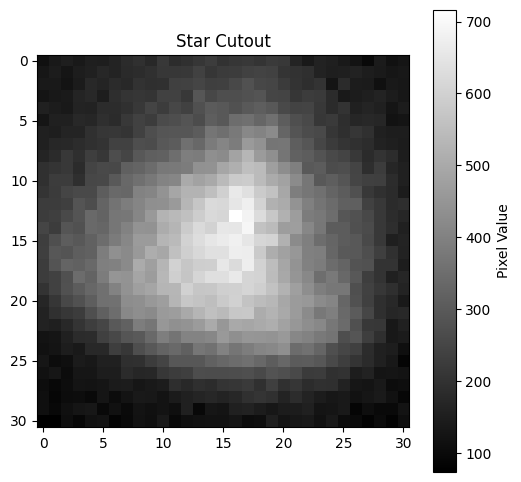

In [ ]:
plt.figure(figsize=(6,6))
plt.imshow(star_cutout, cmap='gray')
plt.title('Star Cutout')
plt.colorbar(label='Pixel Value')
plt.show()

In [ ]:
fwhm_avg = np.mean([fwhm_x, fwhm_y])

print(f"Average FWHM: {fwhm_avg:.2f}")

Average FWHM: 22.21


In [ ]:
aperture_radius = 1.5 * fwhm_avg
print(f"Aperture radius: {aperture_radius:.2f}")

Aperture radius: 33.31


In [ ]:
fitted_x_image = x_min + g_fit.x_mean.value
fitted_y_image = y_min + g_fit.y_mean.value

positions = [(fitted_x_image, fitted_y_image)]

# Define background annulus radii
inner_annulus_radius = 2.0 * aperture_radius
outer_annulus_radius = 3.0 * aperture_radius

# Create aperture and annulus objects
aperture = CircularAperture(positions, r=aperture_radius)
annulus_aperture = CircularAnnulus(positions, r_in=inner_annulus_radius, r_out=outer_annulus_radius)

print(f"Fitted star center in original image: x={fitted_x_image:.2f}, y={fitted_y_image:.2f}")
print(f"Aperture radius: {aperture_radius:.2f}")
print(f"Inner annulus radius: {inner_annulus_radius:.2f}")
print(f"Outer annulus radius: {outer_annulus_radius:.2f}")

Fitted star center in original image: x=216.01, y=107.10
Aperture radius: 33.31
Inner annulus radius: 66.62
Outer annulus radius: 99.93


In [ ]:
aperture_radius = 23
inner_annulus_radius = 2.0 * aperture_radius
outer_annulus_radius = 3.0 * aperture_radius
print(f"Fitted star center in original image: x={fitted_x_image:.2f}, y={fitted_y_image:.2f}")
print(f"Aperture radius: {aperture_radius:.2f}")
print(f"Inner annulus radius: {inner_annulus_radius:.2f}")
print(f"Outer annulus radius: {outer_annulus_radius:.2f}")
aperture = CircularAperture(positions, r=aperture_radius)
annulus_aperture = CircularAnnulus(positions, r_in=inner_annulus_radius, r_out=outer_annulus_radius)

Fitted star center in original image: x=216.01, y=107.10
Aperture radius: 23.00
Inner annulus radius: 46.00
Outer annulus radius: 69.00


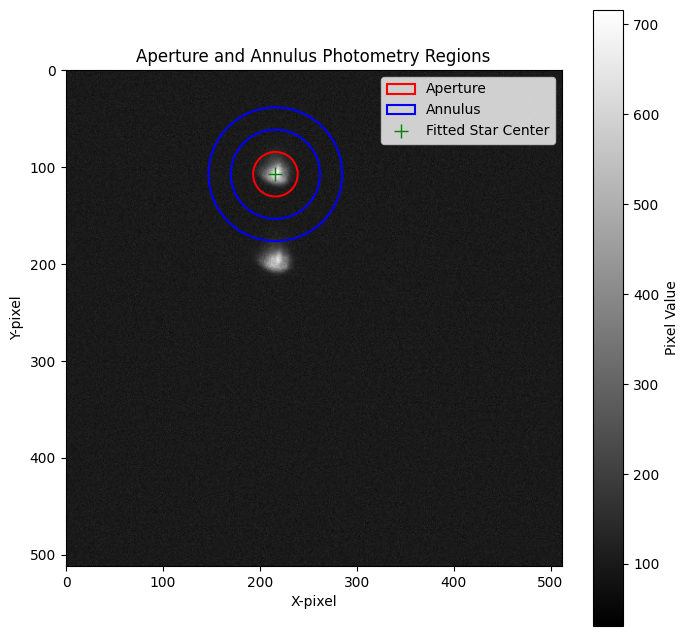

In [ ]:
plt.figure(figsize=(8, 8))
plt.imshow(image, cmap='gray')
aperture.plot(color='red', lw=1.5, label='Aperture')
annulus_aperture.plot(color='blue', lw=1.5, label='Annulus')

# Optional: plot the fitted star center
plt.plot(fitted_x_image, fitted_y_image, 'g+', markersize=10, label='Fitted Star Center')

plt.title('Aperture and Annulus Photometry Regions')
plt.xlabel('X-pixel')
plt.ylabel('Y-pixel')
plt.legend()
plt.colorbar(label='Pixel Value')
plt.show()

In [ ]:
phot_table = aperture_photometry(image, aperture)
annulus_phot_table = aperture_photometry(image, annulus_aperture)

# Calculate mean background in the annulus
b_mean = annulus_phot_table['aperture_sum'] / annulus_aperture.area

# Calculate total background in the aperture
b_sum = b_mean * aperture.area

# Calculate background-subtracted flux
final_flux2251 = phot_table['aperture_sum'] - b_sum

print(f"Raw aperture flux: {phot_table['aperture_sum'][0]:.2f}")
print(f"Mean background per pixel: {b_mean[0]:.2f}")
print(f"Total background in aperture: {b_sum[0]:.2f}")
print(f"Background-subtracted flux: {final_flux2251[0]:.2f}")

Raw aperture flux: 371611.17
Mean background per pixel: 103.50
Total background in aperture: 172012.12
Background-subtracted flux: 199599.05


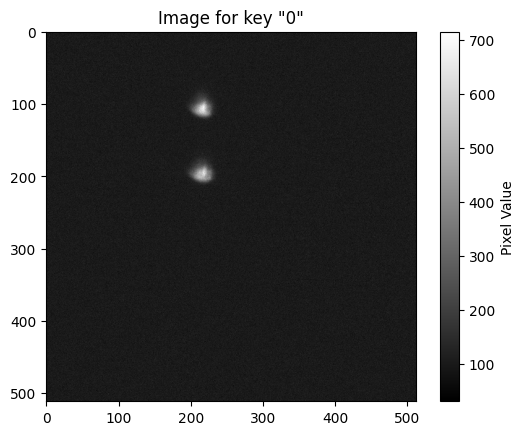

In [ ]:
plt.imshow(images['22.5'], cmap='gray')


plt.title('Image for key "0"')
plt.colorbar(label='Pixel Value')
plt.show()

center x, y =  [215.71092182] [198.03409625]


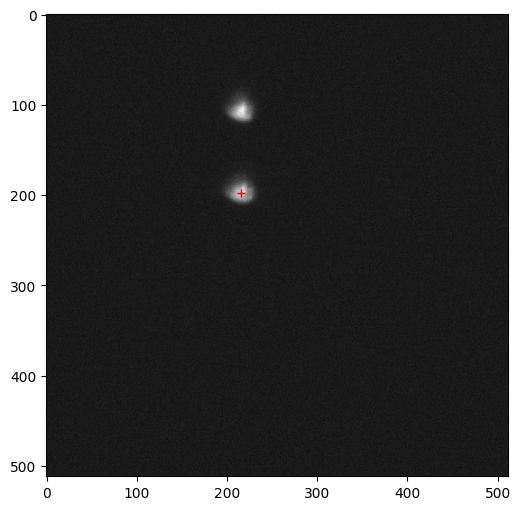

In [ ]:
x0, y0 = 200, 200 # rough guess for central coordinates of a star
cutout = 31 # subimage or cutout around x0, y0.

from photutils.centroids import centroid_2dg, centroid_sources

# centroid_2g will fit 2d gausssian arund x0,y0 to find exact cenetr

x, y = centroid_sources(images['22.5'], x0, y0, box_size=cutout, centroid_func=centroid_2dg)

print('center x, y = ',x,y)

plt.figure(figsize=(6,6))
plt.imshow(images['22.5'], cmap='gray')
plt.plot(x,y, 'r+')
plt.show()

In [ ]:
image = images['22.5']

In [ ]:
cutout_size = cutout # Already defined as 31 from previous step
half_cutout = int(cutout_size / 2)

x_center = int(x)
y_center = int(y)

# Calculate min and max coordinates for the cutout, ensuring they stay within image bounds
x_min = max(0, x_center - half_cutout)
x_max = min(image.shape[1], x_center + half_cutout + 1) # +1 because slicing is exclusive
y_min = max(0, y_center - half_cutout)
y_max = min(image.shape[0], y_center + half_cutout + 1) # +1 because slicing is exclusive

star_cutout = image[y_min:y_max, x_min:x_max]

print(f"Star cutout shape: {star_cutout.shape}")
print(f"Cutout x_min: {x_min}, x_max: {x_max}, y_min: {y_min}, y_max: {y_max}")


Star cutout shape: (31, 31)
Cutout x_min: 200, x_max: 231, y_min: 183, y_max: 214


/tmp/ipython-input-2146860284.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x_center = int(x)
/tmp/ipython-input-2146860284.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_center = int(y)


In [ ]:
ny, nx = star_cutout.shape # Get dimensions of the star_cutout

x_indices = np.arange(nx) # Create 1D array for x-coordinates
y_indices = np.arange(ny) # Create 1D array for y-coordinates

x_mesh, y_mesh = np.meshgrid(x_indices, y_indices) # Create 2D coordinate grids

x_data = x_mesh.ravel() # Flatten x_mesh into 1D array
y_data = y_mesh.ravel() # Flatten y_mesh into 1D array
z_data = star_cutout.ravel() # Flatten star_cutout into 1D array

print(f"Shape of x_mesh: {x_mesh.shape}")
print(f"Shape of y_mesh: {y_mesh.shape}")
print(f"Shape of z_data (flattened cutout): {z_data.shape}")

Shape of x_mesh: (31, 31)
Shape of y_mesh: (31, 31)
Shape of z_data (flattened cutout): (961,)


In [ ]:
from astropy.modeling.models import Gaussian2D
from astropy.modeling.fitting import LevMarLSQFitter

# Initial guesses for Gaussian parameters
amplitude_guess = np.max(star_cutout) # Use the maximum pixel value as initial amplitude
x_mean_guess = nx / 2.0 # Center of the cutout in x
y_mean_guess = ny / 2.0 # Center of the cutout in y
x_stddev_guess = 2.0 # Initial guess for standard deviation in x
y_stddev_guess = 2.0 # Initial guess for standard deviation in y

# Define the 2D Gaussian model with initial guesses
g_init = Gaussian2D(amplitude=amplitude_guess, x_mean=x_mean_guess, y_mean=y_mean_guess,
                     x_stddev=x_stddev_guess, y_stddev=y_stddev_guess)

print(f"Initial Gaussian parameters: ")
print(f"  Amplitude: {g_init.amplitude.value}")
print(f"  x_mean: {g_init.x_mean.value}")
print(f"  y_mean: {g_init.y_mean.value}")
print(f"  x_stddev: {g_init.x_stddev.value}")
print(f"  y_stddev: {g_init.y_stddev.value}")

Initial Gaussian parameters: 
  Amplitude: 652.0
  x_mean: 15.5
  y_mean: 15.5
  x_stddev: 2.0
  y_stddev: 2.0


In [ ]:
fitter = LevMarLSQFitter() # Initialize the fitter
g_fit = fitter(g_init, x_data, y_data, z_data) # Fit the model to the data

print(f"Fitted Gaussian parameters:")
print(f"  Amplitude: {g_fit.amplitude.value:.2f}")
print(f"  x_mean: {g_fit.x_mean.value:.2f}")
print(f"  y_mean: {g_fit.y_mean.value:.2f}")
print(f"  x_stddev: {g_fit.x_stddev.value:.2f}")
print(f"  y_stddev: {g_fit.y_stddev.value:.2f}")

Fitted Gaussian parameters:
  Amplitude: 577.01
  x_mean: 15.93
  y_mean: 14.20
  x_stddev: 10.98
  y_stddev: 9.22


In [ ]:
fwhm_x = 2 * np.sqrt(2 * np.log(2)) * g_fit.x_stddev.value
fwhm_y = 2 * np.sqrt(2 * np.log(2)) * g_fit.y_stddev.value

print(f"FWHM in x-direction: {fwhm_x:.2f}")
print(f"FWHM in y-direction: {fwhm_y:.2f}")

FWHM in x-direction: 25.86
FWHM in y-direction: 21.72


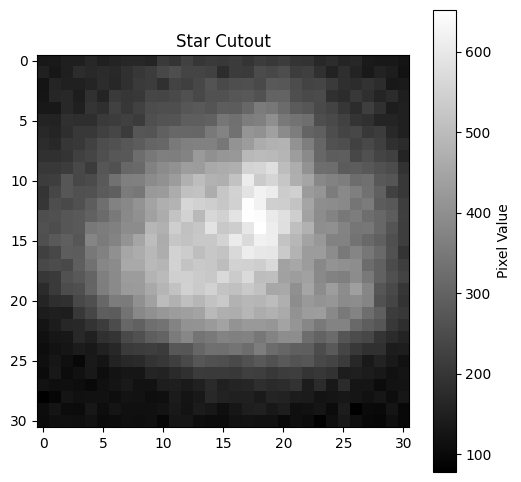

In [ ]:
plt.figure(figsize=(6,6))
plt.imshow(star_cutout, cmap='gray')
plt.title('Star Cutout')
plt.colorbar(label='Pixel Value')
plt.show()

In [ ]:
fwhm_avg = np.mean([fwhm_x, fwhm_y])

print(f"Average FWHM: {fwhm_avg:.2f}")

Average FWHM: 23.79


In [ ]:
aperture_radius = 1.5 * fwhm_avg
print(f"Aperture radius: {aperture_radius:.2f}")

Aperture radius: 35.68


In [ ]:
fitted_x_image = x_min + g_fit.x_mean.value
fitted_y_image = y_min + g_fit.y_mean.value

positions = [(fitted_x_image, fitted_y_image)]

# Define background annulus radii
inner_annulus_radius = 2.0 * aperture_radius
outer_annulus_radius = 3.0 * aperture_radius

# Create aperture and annulus objects
aperture = CircularAperture(positions, r=aperture_radius)
annulus_aperture = CircularAnnulus(positions, r_in=inner_annulus_radius, r_out=outer_annulus_radius)

print(f"Fitted star center in original image: x={fitted_x_image:.2f}, y={fitted_y_image:.2f}")
print(f"Aperture radius: {aperture_radius:.2f}")
print(f"Inner annulus radius: {inner_annulus_radius:.2f}")
print(f"Outer annulus radius: {outer_annulus_radius:.2f}")

Fitted star center in original image: x=215.93, y=197.20
Aperture radius: 35.68
Inner annulus radius: 71.37
Outer annulus radius: 107.05


In [ ]:
aperture_radius = 23
inner_annulus_radius = 2.0 * aperture_radius
outer_annulus_radius = 3.0 * aperture_radius
print(f"Fitted star center in original image: x={fitted_x_image:.2f}, y={fitted_y_image:.2f}")
print(f"Aperture radius: {aperture_radius:.2f}")
print(f"Inner annulus radius: {inner_annulus_radius:.2f}")
print(f"Outer annulus radius: {outer_annulus_radius:.2f}")
aperture = CircularAperture(positions, r=aperture_radius)
annulus_aperture = CircularAnnulus(positions, r_in=inner_annulus_radius, r_out=outer_annulus_radius)

Fitted star center in original image: x=215.93, y=197.20
Aperture radius: 23.00
Inner annulus radius: 46.00
Outer annulus radius: 69.00


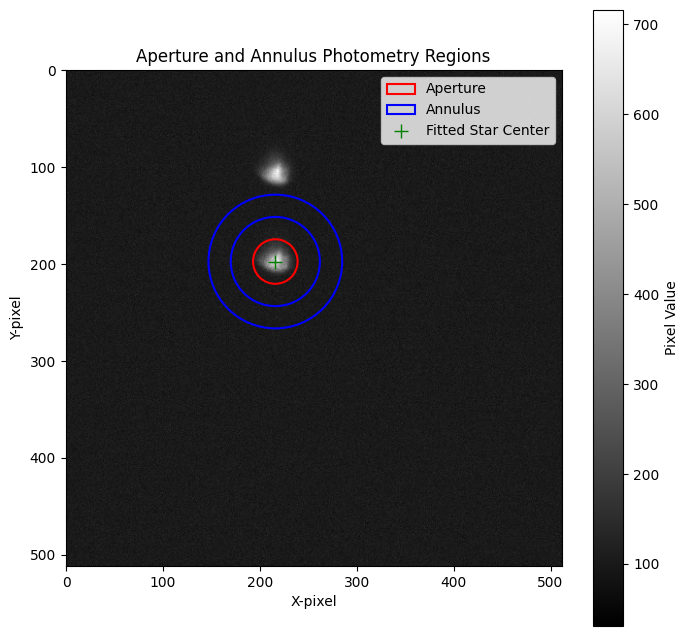

In [ ]:
plt.figure(figsize=(8, 8))
plt.imshow(image, cmap='gray')
aperture.plot(color='red', lw=1.5, label='Aperture')
annulus_aperture.plot(color='blue', lw=1.5, label='Annulus')

# Optional: plot the fitted star center
plt.plot(fitted_x_image, fitted_y_image, 'g+', markersize=10, label='Fitted Star Center')

plt.title('Aperture and Annulus Photometry Regions')
plt.xlabel('X-pixel')
plt.ylabel('Y-pixel')
plt.legend()
plt.colorbar(label='Pixel Value')
plt.show()

In [ ]:
phot_table = aperture_photometry(image, aperture)
annulus_phot_table = aperture_photometry(image, annulus_aperture)

# Calculate mean background in the annulus
b_mean = annulus_phot_table['aperture_sum'] / annulus_aperture.area

# Calculate total background in the aperture
b_sum = b_mean * aperture.area

# Calculate background-subtracted flux
final_flux2252 = phot_table['aperture_sum'] - b_sum

print(f"Raw aperture flux: {phot_table['aperture_sum'][0]:.2f}")
print(f"Mean background per pixel: {b_mean[0]:.2f}")
print(f"Total background in aperture: {b_sum[0]:.2f}")
print(f"Background-subtracted flux: {final_flux2252[0]:.2f}")

Raw aperture flux: 373710.29
Mean background per pixel: 103.02
Total background in aperture: 171215.88
Background-subtracted flux: 202494.41


Code 3

center x, y =  [214.35666515] [107.25708274]


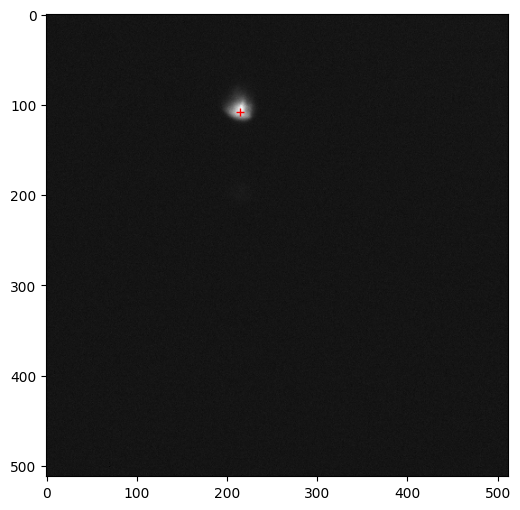

In [ ]:
x0, y0 = 195, 100 # rough guess for central coordinates of a star
cutout = 31 # subimage or cutout around x0, y0.

from photutils.centroids import centroid_2dg, centroid_sources

# centroid_2g will fit 2d gausssian arund x0,y0 to find exact cenetr

x, y = centroid_sources(images['45'], x0, y0, box_size=cutout, centroid_func=centroid_2dg)

print('center x, y = ',x,y)

plt.figure(figsize=(6,6))
plt.imshow(images['45'], cmap='gray')
plt.plot(x,y, 'r+')
plt.show()

In [ ]:
image = images['45']

In [ ]:
cutout_size = cutout # Already defined as 31 from previous step
half_cutout = int(cutout_size / 2)

x_center = int(x)
y_center = int(y)

# Calculate min and max coordinates for the cutout, ensuring they stay within image bounds
x_min = max(0, x_center - half_cutout)
x_max = min(image.shape[1], x_center + half_cutout + 1) # +1 because slicing is exclusive
y_min = max(0, y_center - half_cutout)
y_max = min(image.shape[0], y_center + half_cutout + 1) # +1 because slicing is exclusive

star_cutout = image[y_min:y_max, x_min:x_max]

print(f"Star cutout shape: {star_cutout.shape}")
print(f"Cutout x_min: {x_min}, x_max: {x_max}, y_min: {y_min}, y_max: {y_max}")


Star cutout shape: (31, 31)
Cutout x_min: 199, x_max: 230, y_min: 92, y_max: 123


/tmp/ipython-input-2146860284.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x_center = int(x)
/tmp/ipython-input-2146860284.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_center = int(y)


In [ ]:
ny, nx = star_cutout.shape # Get dimensions of the star_cutout

x_indices = np.arange(nx) # Create 1D array for x-coordinates
y_indices = np.arange(ny) # Create 1D array for y-coordinates

x_mesh, y_mesh = np.meshgrid(x_indices, y_indices) # Create 2D coordinate grids

x_data = x_mesh.ravel() # Flatten x_mesh into 1D array
y_data = y_mesh.ravel() # Flatten y_mesh into 1D array
z_data = star_cutout.ravel() # Flatten star_cutout into 1D array

print(f"Shape of x_mesh: {x_mesh.shape}")
print(f"Shape of y_mesh: {y_mesh.shape}")
print(f"Shape of z_data (flattened cutout): {z_data.shape}")

Shape of x_mesh: (31, 31)
Shape of y_mesh: (31, 31)
Shape of z_data (flattened cutout): (961,)


In [ ]:
from astropy.modeling.models import Gaussian2D
from astropy.modeling.fitting import LevMarLSQFitter

# Initial guesses for Gaussian parameters
amplitude_guess = np.max(star_cutout) # Use the maximum pixel value as initial amplitude
x_mean_guess = nx / 2.0 # Center of the cutout in x
y_mean_guess = ny / 2.0 # Center of the cutout in y
x_stddev_guess = 2.0 # Initial guess for standard deviation in x
y_stddev_guess = 2.0 # Initial guess for standard deviation in y

# Define the 2D Gaussian model with initial guesses
g_init = Gaussian2D(amplitude=amplitude_guess, x_mean=x_mean_guess, y_mean=y_mean_guess,
                     x_stddev=x_stddev_guess, y_stddev=y_stddev_guess)

print(f"Initial Gaussian parameters: ")
print(f"  Amplitude: {g_init.amplitude.value}")
print(f"  x_mean: {g_init.x_mean.value}")
print(f"  y_mean: {g_init.y_mean.value}")
print(f"  x_stddev: {g_init.x_stddev.value}")
print(f"  y_stddev: {g_init.y_stddev.value}")

Initial Gaussian parameters: 
  Amplitude: 1242.0
  x_mean: 15.5
  y_mean: 15.5
  x_stddev: 2.0
  y_stddev: 2.0


In [ ]:
fitter = LevMarLSQFitter() # Initialize the fitter
g_fit = fitter(g_init, x_data, y_data, z_data) # Fit the model to the data

print(f"Fitted Gaussian parameters:")
print(f"  Amplitude: {g_fit.amplitude.value:.2f}")
print(f"  x_mean: {g_fit.x_mean.value:.2f}")
print(f"  y_mean: {g_fit.y_mean.value:.2f}")
print(f"  x_stddev: {g_fit.x_stddev.value:.2f}")
print(f"  y_stddev: {g_fit.y_stddev.value:.2f}")

Fitted Gaussian parameters:
  Amplitude: 1110.82
  x_mean: 15.72
  y_mean: 13.61
  x_stddev: 8.16
  y_stddev: 8.88


In [ ]:
fwhm_x = 2 * np.sqrt(2 * np.log(2)) * g_fit.x_stddev.value
fwhm_y = 2 * np.sqrt(2 * np.log(2)) * g_fit.y_stddev.value

print(f"FWHM in x-direction: {fwhm_x:.2f}")
print(f"FWHM in y-direction: {fwhm_y:.2f}")

FWHM in x-direction: 19.22
FWHM in y-direction: 20.92


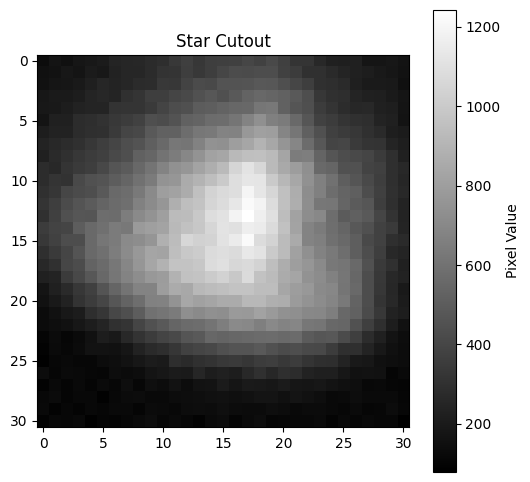

In [ ]:
plt.figure(figsize=(6,6))
plt.imshow(star_cutout, cmap='gray')
plt.title('Star Cutout')
plt.colorbar(label='Pixel Value')
plt.show()

In [ ]:
fwhm_avg = np.mean([fwhm_x, fwhm_y])

print(f"Average FWHM: {fwhm_avg:.2f}")

Average FWHM: 20.07


In [ ]:
aperture_radius = 1.5 * fwhm_avg
print(f"Aperture radius: {aperture_radius:.2f}")

Aperture radius: 30.10


In [ ]:
fitted_x_image = x_min + g_fit.x_mean.value
fitted_y_image = y_min + g_fit.y_mean.value

positions = [(fitted_x_image, fitted_y_image)]

# Define background annulus radii
inner_annulus_radius = 2.0 * aperture_radius
outer_annulus_radius = 3.0 * aperture_radius

# Create aperture and annulus objects
aperture = CircularAperture(positions, r=aperture_radius)
annulus_aperture = CircularAnnulus(positions, r_in=inner_annulus_radius, r_out=outer_annulus_radius)

print(f"Fitted star center in original image: x={fitted_x_image:.2f}, y={fitted_y_image:.2f}")
print(f"Aperture radius: {aperture_radius:.2f}")
print(f"Inner annulus radius: {inner_annulus_radius:.2f}")
print(f"Outer annulus radius: {outer_annulus_radius:.2f}")

Fitted star center in original image: x=214.72, y=105.61
Aperture radius: 30.10
Inner annulus radius: 60.20
Outer annulus radius: 90.30


In [ ]:
phot_table = aperture_photometry(image, aperture)
annulus_phot_table = aperture_photometry(image, annulus_aperture)

# Calculate mean background in the annulus
b_mean = annulus_phot_table['aperture_sum'] / annulus_aperture.area

# Calculate total background in the aperture
b_sum = b_mean * aperture.area

# Calculate background-subtracted flux
final_flux45 = phot_table['aperture_sum'] - b_sum

print(f"Raw aperture flux: {phot_table['aperture_sum'][0]:.2f}")
print(f"Mean background per pixel: {b_mean[0]:.2f}")
print(f"Total background in aperture: {b_sum[0]:.2f}")
print(f"Background-subtracted flux: {final_flux45[0]:.2f}")

Raw aperture flux: 682167.30
Mean background per pixel: 103.81
Total background in aperture: 295445.08
Background-subtracted flux: 386722.22


Code 4

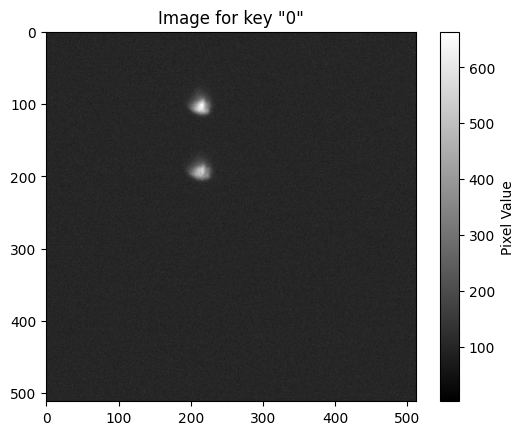

In [ ]:
plt.imshow(images['67.5'], cmap='gray')


plt.title('Image for key "0"')
plt.colorbar(label='Pixel Value')
plt.show()

center x, y =  [214.11844822] [105.35107088]


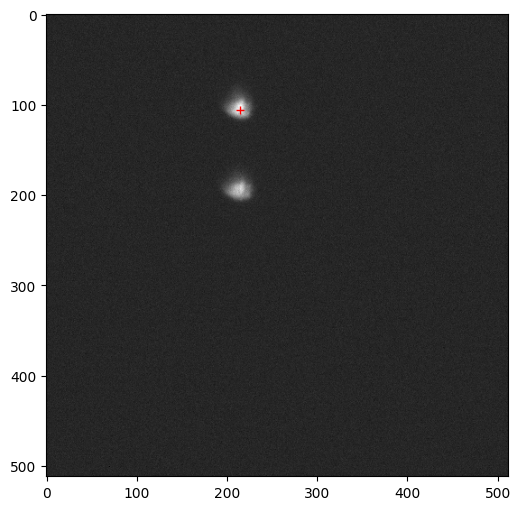

In [ ]:
x0, y0 = 195, 100 # rough guess for central coordinates of a star
cutout = 31 # subimage or cutout around x0, y0.

from photutils.centroids import centroid_2dg, centroid_sources

# centroid_2g will fit 2d gausssian arund x0,y0 to find exact cenetr

x, y = centroid_sources(images['67.5'], x0, y0, box_size=cutout, centroid_func=centroid_2dg)

print('center x, y = ',x,y)

plt.figure(figsize=(6,6))
plt.imshow(images['67.5'], cmap='gray')
plt.plot(x,y, 'r+')
plt.show()

In [ ]:
image = images['67.5']

In [ ]:
cutout_size = cutout # Already defined as 31 from previous step
half_cutout = int(cutout_size / 2)

x_center = int(x)
y_center = int(y)

# Calculate min and max coordinates for the cutout, ensuring they stay within image bounds
x_min = max(0, x_center - half_cutout)
x_max = min(image.shape[1], x_center + half_cutout + 1) # +1 because slicing is exclusive
y_min = max(0, y_center - half_cutout)
y_max = min(image.shape[0], y_center + half_cutout + 1) # +1 because slicing is exclusive

star_cutout = image[y_min:y_max, x_min:x_max]

print(f"Star cutout shape: {star_cutout.shape}")
print(f"Cutout x_min: {x_min}, x_max: {x_max}, y_min: {y_min}, y_max: {y_max}")


Star cutout shape: (31, 31)
Cutout x_min: 199, x_max: 230, y_min: 90, y_max: 121


/tmp/ipython-input-2146860284.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x_center = int(x)
/tmp/ipython-input-2146860284.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_center = int(y)


In [ ]:
ny, nx = star_cutout.shape # Get dimensions of the star_cutout

x_indices = np.arange(nx) # Create 1D array for x-coordinates
y_indices = np.arange(ny) # Create 1D array for y-coordinates

x_mesh, y_mesh = np.meshgrid(x_indices, y_indices) # Create 2D coordinate grids

x_data = x_mesh.ravel() # Flatten x_mesh into 1D array
y_data = y_mesh.ravel() # Flatten y_mesh into 1D array
z_data = star_cutout.ravel() # Flatten star_cutout into 1D array

print(f"Shape of x_mesh: {x_mesh.shape}")
print(f"Shape of y_mesh: {y_mesh.shape}")
print(f"Shape of z_data (flattened cutout): {z_data.shape}")

Shape of x_mesh: (31, 31)
Shape of y_mesh: (31, 31)
Shape of z_data (flattened cutout): (961,)


In [ ]:
from astropy.modeling.models import Gaussian2D
from astropy.modeling.fitting import LevMarLSQFitter

# Initial guesses for Gaussian parameters
amplitude_guess = np.max(star_cutout) # Use the maximum pixel value as initial amplitude
x_mean_guess = nx / 2.0 # Center of the cutout in x
y_mean_guess = ny / 2.0 # Center of the cutout in y
x_stddev_guess = 2.0 # Initial guess for standard deviation in x
y_stddev_guess = 2.0 # Initial guess for standard deviation in y

# Define the 2D Gaussian model with initial guesses
g_init = Gaussian2D(amplitude=amplitude_guess, x_mean=x_mean_guess, y_mean=y_mean_guess,
                     x_stddev=x_stddev_guess, y_stddev=y_stddev_guess)

print(f"Initial Gaussian parameters: ")
print(f"  Amplitude: {g_init.amplitude.value}")
print(f"  x_mean: {g_init.x_mean.value}")
print(f"  y_mean: {g_init.y_mean.value}")
print(f"  x_stddev: {g_init.x_stddev.value}")
print(f"  y_stddev: {g_init.y_stddev.value}")

Initial Gaussian parameters: 
  Amplitude: 664.0
  x_mean: 15.5
  y_mean: 15.5
  x_stddev: 2.0
  y_stddev: 2.0


In [ ]:
fitter = LevMarLSQFitter() # Initialize the fitter
g_fit = fitter(g_init, x_data, y_data, z_data) # Fit the model to the data

print(f"Fitted Gaussian parameters:")
print(f"  Amplitude: {g_fit.amplitude.value:.2f}")
print(f"  x_mean: {g_fit.x_mean.value:.2f}")
print(f"  y_mean: {g_fit.y_mean.value:.2f}")
print(f"  x_stddev: {g_fit.x_stddev.value:.2f}")
print(f"  y_stddev: {g_fit.y_stddev.value:.2f}")

Fitted Gaussian parameters:
  Amplitude: 603.00
  x_mean: 14.88
  y_mean: 14.00
  x_stddev: 9.10
  y_stddev: 9.69


In [ ]:
fwhm_x = 2 * np.sqrt(2 * np.log(2)) * g_fit.x_stddev.value
fwhm_y = 2 * np.sqrt(2 * np.log(2)) * g_fit.y_stddev.value

print(f"FWHM in x-direction: {fwhm_x:.2f}")
print(f"FWHM in y-direction: {fwhm_y:.2f}")

FWHM in x-direction: 21.44
FWHM in y-direction: 22.82


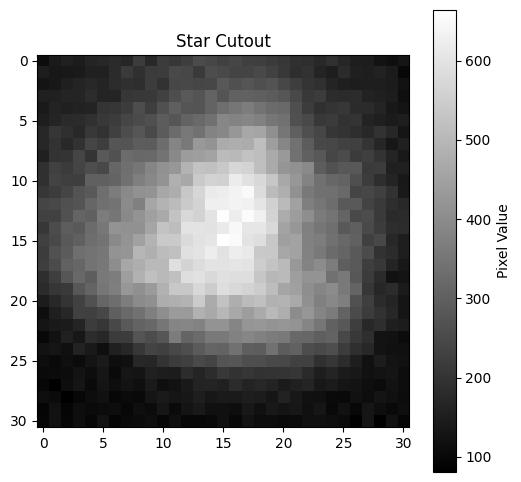

In [ ]:
plt.figure(figsize=(6,6))
plt.imshow(star_cutout, cmap='gray')
plt.title('Star Cutout')
plt.colorbar(label='Pixel Value')
plt.show()

In [ ]:
fwhm_avg = np.mean([fwhm_x, fwhm_y])

print(f"Average FWHM: {fwhm_avg:.2f}")

Average FWHM: 22.13


In [ ]:
aperture_radius = 1.5 * fwhm_avg
print(f"Aperture radius: {aperture_radius:.2f}")

Aperture radius: 33.20


In [ ]:
fitted_x_image = x_min + g_fit.x_mean.value
fitted_y_image = y_min + g_fit.y_mean.value

positions = [(fitted_x_image, fitted_y_image)]

# Define background annulus radii
inner_annulus_radius = 2.0 * aperture_radius
outer_annulus_radius = 3.0 * aperture_radius

# Create aperture and annulus objects
aperture = CircularAperture(positions, r=aperture_radius)
annulus_aperture = CircularAnnulus(positions, r_in=inner_annulus_radius, r_out=outer_annulus_radius)

print(f"Fitted star center in original image: x={fitted_x_image:.2f}, y={fitted_y_image:.2f}")
print(f"Aperture radius: {aperture_radius:.2f}")
print(f"Inner annulus radius: {inner_annulus_radius:.2f}")
print(f"Outer annulus radius: {outer_annulus_radius:.2f}")

Fitted star center in original image: x=213.88, y=104.00
Aperture radius: 33.20
Inner annulus radius: 66.39
Outer annulus radius: 99.59


In [ ]:
aperture_radius = 23
inner_annulus_radius = 2.0 * aperture_radius
outer_annulus_radius = 3.0 * aperture_radius
print(f"Fitted star center in original image: x={fitted_x_image:.2f}, y={fitted_y_image:.2f}")
print(f"Aperture radius: {aperture_radius:.2f}")
print(f"Inner annulus radius: {inner_annulus_radius:.2f}")
print(f"Outer annulus radius: {outer_annulus_radius:.2f}")
aperture = CircularAperture(positions, r=aperture_radius)
annulus_aperture = CircularAnnulus(positions, r_in=inner_annulus_radius, r_out=outer_annulus_radius)

Fitted star center in original image: x=213.88, y=104.00
Aperture radius: 23.00
Inner annulus radius: 46.00
Outer annulus radius: 69.00


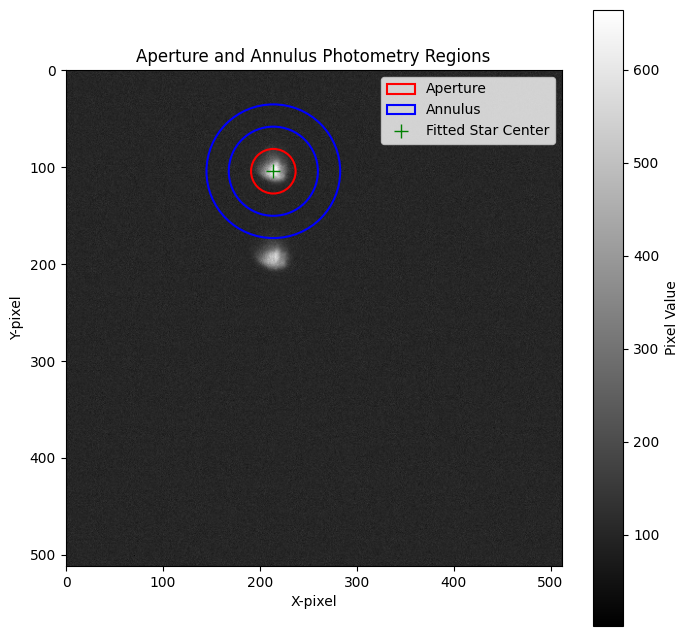

In [ ]:
plt.figure(figsize=(8, 8))
plt.imshow(image, cmap='gray')
aperture.plot(color='red', lw=1.5, label='Aperture')
annulus_aperture.plot(color='blue', lw=1.5, label='Annulus')

# Optional: plot the fitted star center
plt.plot(fitted_x_image, fitted_y_image, 'g+', markersize=10, label='Fitted Star Center')

plt.title('Aperture and Annulus Photometry Regions')
plt.xlabel('X-pixel')
plt.ylabel('Y-pixel')
plt.legend()
plt.colorbar(label='Pixel Value')
plt.show()

In [ ]:
phot_table = aperture_photometry(image, aperture)
annulus_phot_table = aperture_photometry(image, annulus_aperture)

# Calculate mean background in the annulus
b_mean = annulus_phot_table['aperture_sum'] / annulus_aperture.area

# Calculate total background in the aperture
b_sum = b_mean * aperture.area

# Calculate background-subtracted flux
final_flux6751 = phot_table['aperture_sum'] - b_sum

print(f"Raw aperture flux: {phot_table['aperture_sum'][0]:.2f}")
print(f"Mean background per pixel: {b_mean[0]:.2f}")
print(f"Total background in aperture: {b_sum[0]:.2f}")
print(f"Background-subtracted flux: {final_flux6751[0]:.2f}")

Raw aperture flux: 362905.75
Mean background per pixel: 103.38
Total background in aperture: 171809.83
Background-subtracted flux: 191095.92


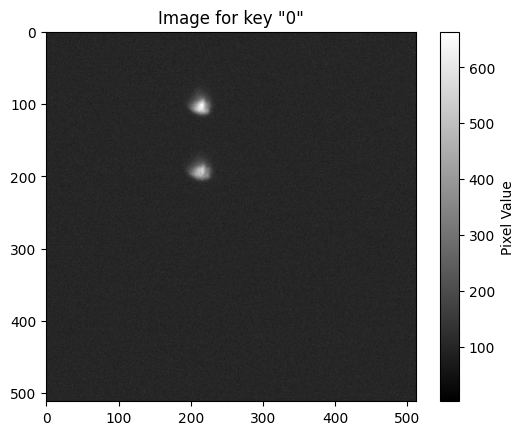

In [ ]:
plt.imshow(images['67.5'], cmap='gray')


plt.title('Image for key "0"')
plt.colorbar(label='Pixel Value')
plt.show()

center x, y =  [214.26603036] [194.38280906]


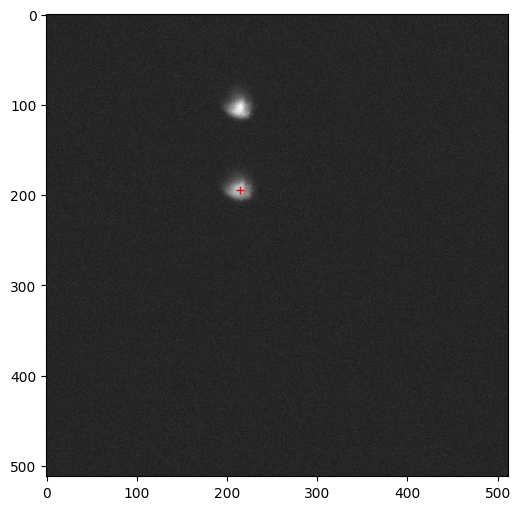

In [ ]:
x0, y0 = 200, 190 # rough guess for central coordinates of a star
cutout = 31 # subimage or cutout around x0, y0.

from photutils.centroids import centroid_2dg, centroid_sources

# centroid_2g will fit 2d gausssian arund x0,y0 to find exact cenetr

x, y = centroid_sources(images['67.5'], x0, y0, box_size=cutout, centroid_func=centroid_2dg)

print('center x, y = ',x,y)

plt.figure(figsize=(6,6))
plt.imshow(images['67.5'], cmap='gray')
plt.plot(x,y, 'r+')
plt.show()

In [ ]:
image = images['67.5']

In [ ]:
cutout_size = cutout # Already defined as 31 from previous step
half_cutout = int(cutout_size / 2)

x_center = int(x)
y_center = int(y)

# Calculate min and max coordinates for the cutout, ensuring they stay within image bounds
x_min = max(0, x_center - half_cutout)
x_max = min(image.shape[1], x_center + half_cutout + 1) # +1 because slicing is exclusive
y_min = max(0, y_center - half_cutout)
y_max = min(image.shape[0], y_center + half_cutout + 1) # +1 because slicing is exclusive

star_cutout = image[y_min:y_max, x_min:x_max]

print(f"Star cutout shape: {star_cutout.shape}")
print(f"Cutout x_min: {x_min}, x_max: {x_max}, y_min: {y_min}, y_max: {y_max}")


Star cutout shape: (31, 31)
Cutout x_min: 199, x_max: 230, y_min: 179, y_max: 210


/tmp/ipython-input-2146860284.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x_center = int(x)
/tmp/ipython-input-2146860284.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_center = int(y)


In [ ]:
ny, nx = star_cutout.shape # Get dimensions of the star_cutout

x_indices = np.arange(nx) # Create 1D array for x-coordinates
y_indices = np.arange(ny) # Create 1D array for y-coordinates

x_mesh, y_mesh = np.meshgrid(x_indices, y_indices) # Create 2D coordinate grids

x_data = x_mesh.ravel() # Flatten x_mesh into 1D array
y_data = y_mesh.ravel() # Flatten y_mesh into 1D array
z_data = star_cutout.ravel() # Flatten star_cutout into 1D array

print(f"Shape of x_mesh: {x_mesh.shape}")
print(f"Shape of y_mesh: {y_mesh.shape}")
print(f"Shape of z_data (flattened cutout): {z_data.shape}")

Shape of x_mesh: (31, 31)
Shape of y_mesh: (31, 31)
Shape of z_data (flattened cutout): (961,)


In [ ]:
from astropy.modeling.models import Gaussian2D
from astropy.modeling.fitting import LevMarLSQFitter

# Initial guesses for Gaussian parameters
amplitude_guess = np.max(star_cutout) # Use the maximum pixel value as initial amplitude
x_mean_guess = nx / 2.0 # Center of the cutout in x
y_mean_guess = ny / 2.0 # Center of the cutout in y
x_stddev_guess = 2.0 # Initial guess for standard deviation in x
y_stddev_guess = 2.0 # Initial guess for standard deviation in y

# Define the 2D Gaussian model with initial guesses
g_init = Gaussian2D(amplitude=amplitude_guess, x_mean=x_mean_guess, y_mean=y_mean_guess,
                     x_stddev=x_stddev_guess, y_stddev=y_stddev_guess)

print(f"Initial Gaussian parameters: ")
print(f"  Amplitude: {g_init.amplitude.value}")
print(f"  x_mean: {g_init.x_mean.value}")
print(f"  y_mean: {g_init.y_mean.value}")
print(f"  x_stddev: {g_init.x_stddev.value}")
print(f"  y_stddev: {g_init.y_stddev.value}")

Initial Gaussian parameters: 
  Amplitude: 588.0
  x_mean: 15.5
  y_mean: 15.5
  x_stddev: 2.0
  y_stddev: 2.0


In [ ]:
fitter = LevMarLSQFitter() # Initialize the fitter
g_fit = fitter(g_init, x_data, y_data, z_data) # Fit the model to the data

print(f"Fitted Gaussian parameters:")
print(f"  Amplitude: {g_fit.amplitude.value:.2f}")
print(f"  x_mean: {g_fit.x_mean.value:.2f}")
print(f"  y_mean: {g_fit.y_mean.value:.2f}")
print(f"  x_stddev: {g_fit.x_stddev.value:.2f}")
print(f"  y_stddev: {g_fit.y_stddev.value:.2f}")

Fitted Gaussian parameters:
  Amplitude: 511.19
  x_mean: 14.64
  y_mean: 15.00
  x_stddev: 9.53
  y_stddev: 11.05


In [ ]:
fwhm_x = 2 * np.sqrt(2 * np.log(2)) * g_fit.x_stddev.value
fwhm_y = 2 * np.sqrt(2 * np.log(2)) * g_fit.y_stddev.value

print(f"FWHM in x-direction: {fwhm_x:.2f}")
print(f"FWHM in y-direction: {fwhm_y:.2f}")

FWHM in x-direction: 22.45
FWHM in y-direction: 26.03


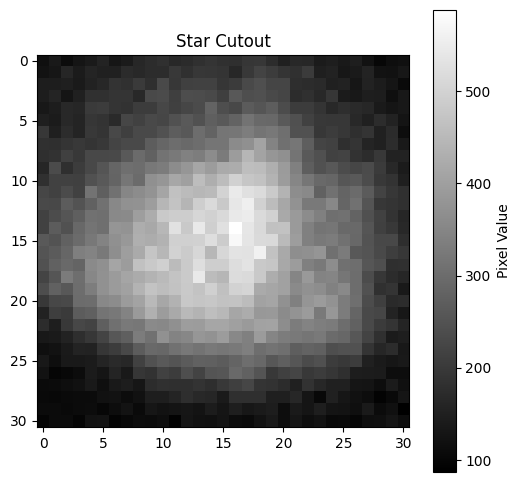

In [ ]:
plt.figure(figsize=(6,6))
plt.imshow(star_cutout, cmap='gray')
plt.title('Star Cutout')
plt.colorbar(label='Pixel Value')
plt.show()

In [ ]:
fwhm_avg = np.mean([fwhm_x, fwhm_y])

print(f"Average FWHM: {fwhm_avg:.2f}")

Average FWHM: 24.24


In [ ]:
aperture_radius = 1.5 * fwhm_avg
print(f"Aperture radius: {aperture_radius:.2f}")

Aperture radius: 36.35


In [ ]:
fitted_x_image = x_min + g_fit.x_mean.value
fitted_y_image = y_min + g_fit.y_mean.value

positions = [(fitted_x_image, fitted_y_image)]

# Define background annulus radii
inner_annulus_radius = 2.0 * aperture_radius
outer_annulus_radius = 3.0 * aperture_radius

# Create aperture and annulus objects
aperture = CircularAperture(positions, r=aperture_radius)
annulus_aperture = CircularAnnulus(positions, r_in=inner_annulus_radius, r_out=outer_annulus_radius)

print(f"Fitted star center in original image: x={fitted_x_image:.2f}, y={fitted_y_image:.2f}")
print(f"Aperture radius: {aperture_radius:.2f}")
print(f"Inner annulus radius: {inner_annulus_radius:.2f}")
print(f"Outer annulus radius: {outer_annulus_radius:.2f}")

Fitted star center in original image: x=213.64, y=194.00
Aperture radius: 36.35
Inner annulus radius: 72.71
Outer annulus radius: 109.06


In [ ]:
aperture_radius = 23
inner_annulus_radius = 2.0 * aperture_radius
outer_annulus_radius = 3.0 * aperture_radius
print(f"Fitted star center in original image: x={fitted_x_image:.2f}, y={fitted_y_image:.2f}")
print(f"Aperture radius: {aperture_radius:.2f}")
print(f"Inner annulus radius: {inner_annulus_radius:.2f}")
print(f"Outer annulus radius: {outer_annulus_radius:.2f}")
aperture = CircularAperture(positions, r=aperture_radius)
annulus_aperture = CircularAnnulus(positions, r_in=inner_annulus_radius, r_out=outer_annulus_radius)

Fitted star center in original image: x=213.64, y=194.00
Aperture radius: 23.00
Inner annulus radius: 46.00
Outer annulus radius: 69.00


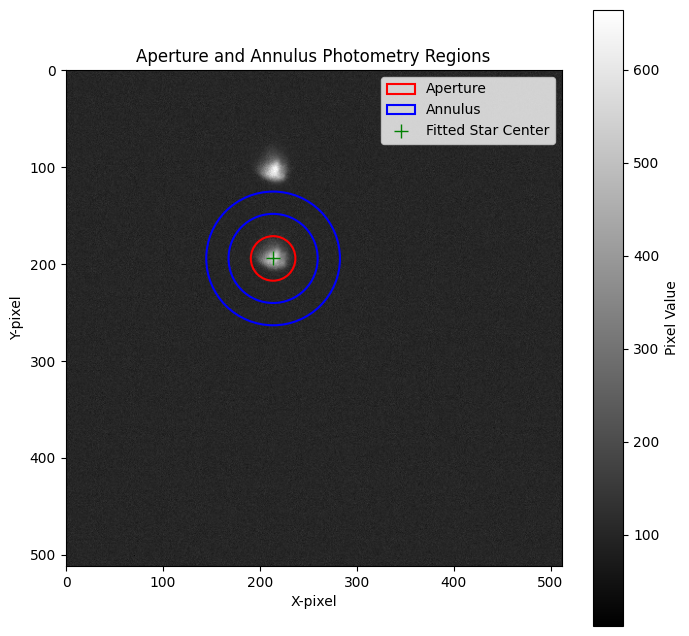

In [ ]:
plt.figure(figsize=(8, 8))
plt.imshow(image, cmap='gray')
aperture.plot(color='red', lw=1.5, label='Aperture')
annulus_aperture.plot(color='blue', lw=1.5, label='Annulus')

# Optional: plot the fitted star center
plt.plot(fitted_x_image, fitted_y_image, 'g+', markersize=10, label='Fitted Star Center')

plt.title('Aperture and Annulus Photometry Regions')
plt.xlabel('X-pixel')
plt.ylabel('Y-pixel')
plt.legend()
plt.colorbar(label='Pixel Value')
plt.show()

In [ ]:
phot_table = aperture_photometry(image, aperture)
annulus_phot_table = aperture_photometry(image, annulus_aperture)

# Calculate mean background in the annulus
b_mean = annulus_phot_table['aperture_sum'] / annulus_aperture.area

# Calculate total background in the aperture
b_sum = b_mean * aperture.area

# Calculate background-subtracted flux
final_flux6752 = phot_table['aperture_sum'] - b_sum

print(f"Raw aperture flux: {phot_table['aperture_sum'][0]:.2f}")
print(f"Mean background per pixel: {b_mean[0]:.2f}")
print(f"Total background in aperture: {b_sum[0]:.2f}")
print(f"Background-subtracted flux: {final_flux6752[0]:.2f}")

Raw aperture flux: 344642.90
Mean background per pixel: 102.83
Total background in aperture: 170896.60
Background-subtracted flux: 173746.30


In [ ]:
flux_0=final_flux0
flux_225_0=final_flux2251
flux_225_e=final_flux2252
flux_45=final_flux45
flux_675_0=final_flux6751
flux_675_e=final_flux6752

In [ ]:
R_0 = flux_45 / flux_0
R_225 = (flux_225_0 - flux_225_e) / (flux_225_0 + flux_225_e)

print(f"Degree of polarisation: {R_0[0]:.2f}")
AoP = 0.5 * np.degrees(np.arctan2(R_225, R_0))
print(f"Angle of Polarization (AoP): {AoP[0]:.4f} degrees")

Degree of polarisation: 0.82
Angle of Polarization (AoP): -0.2520 degrees
